Load a model then use it on test images.

In [7]:
import tensorflow as tf
from glob import glob
import os.path
import cv2
import scipy.misc
import numpy as np
import matplotlib.pyplot as plt

TEST_DIR = '../lyft_training_data/Test/CameraRGB'
MODEL_DIR = 'saved_models/2018-05-26-1309'
IMG_SIZE = (256, 256)

def reshape_to_ori(mask, ori_img_shape):
    scale_height = int(ori_img_shape[0])
    scale_width = int(ori_img_shape[1])
    mask = cv2.resize(mask, (scale_width, scale_height), interpolation=cv2.INTER_NEAREST)
    return mask

def gen_test_output(sess, logits, image_pl, data_folder, image_shape):
    """
    Generate test output using the test images
    :param sess: TF session
    :param logits: TF Tensor for the logits
    :param image_pl: TF Placeholder for the image placeholder
    :param data_folder: Path to the folder that contains the datasets
    :param image_shape: Tuple - Shape of image
    :return: Output for for each test image
    """
    for image_file in glob(os.path.join(data_folder, '*.png')):
        ori_img = cv2.cvtColor(cv2.imread(image_file), cv2.COLOR_BGR2RGB)
        image = cv2.resize(ori_img, (image_shape[1], image_shape[0]))

        output_image = sess.run(
            logits,
            {image_pl: [image]})
        
        output_image = np.array(output_image[0,:,:,:])
        
        print("output_image shape:", output_image.shape)

        im_softmax_road = output_image[:, :, 1].reshape(image_shape[0], image_shape[1])
        im_softmax_vehicle = output_image[:, :, 2].reshape(image_shape[0], image_shape[1])

        seg_road = \
          ((im_softmax_road >= 0.50) & (im_softmax_road >= im_softmax_vehicle)). \
            reshape(image_shape[0], image_shape[1], 1)
            
        seg_vehicle = \
          ((im_softmax_vehicle >= 0.50) & (im_softmax_vehicle >= im_softmax_road)) . \
            reshape(image_shape[0], image_shape[1], 1)

        mask = np.dot(seg_road, np.array([[0, 255, 0, 127]])) + \
               np.dot(seg_vehicle, np.array([[255, 0, 0, 127]]))
        
        mask = reshape_to_ori(mask, ori_img.shape)

        mask = scipy.misc.toimage(mask, mode="RGBA")
        
        street_im = scipy.misc.toimage(ori_img)
        street_im.paste(mask, box=None, mask=mask)

        yield os.path.basename(image_file), np.array(street_im)

In [8]:
%%capture
# https://stackoverflow.com/questions/33759623/tensorflow-how-to-save-restore-a-model/47235448#47235448

sess = tf.Session()
signature_key = tf.saved_model.signature_constants.DEFAULT_SERVING_SIGNATURE_DEF_KEY

meta_graph_def = tf.saved_model.loader.load(sess,
                                            [tf.saved_model.tag_constants.SERVING], MODEL_DIR)

image_input = sess.graph.get_tensor_by_name('net_input:0')
logits = sess.graph.get_tensor_by_name('logits_1:0')

image_outputs = gen_test_output(sess, logits, image_input, TEST_DIR, IMG_SIZE)

images = []
image_names = []
for name, img in image_outputs:
    image_names.append(name)
    images.append(img)

INFO:tensorflow:Restoring parameters from b'saved_models/2018-05-26-1309/variables/variables'
output_image shape: (256, 256, 3)
output_image shape: (256, 256, 3)
output_image shape: (256, 256, 3)


/home/jay/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:52: DeprecationWarning: `toimage` is deprecated!
`toimage` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use Pillow's ``Image.fromarray`` directly instead.
/home/jay/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:54: DeprecationWarning: `toimage` is deprecated!
`toimage` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use Pillow's ``Image.fromarray`` directly instead.


output_image shape: (256, 256, 3)
output_image shape: (256, 256, 3)
output_image shape: (256, 256, 3)
output_image shape: (256, 256, 3)
output_image shape: (256, 256, 3)
output_image shape: (256, 256, 3)
output_image shape: (256, 256, 3)
output_image shape: (256, 256, 3)
output_image shape: (256, 256, 3)
output_image shape: (256, 256, 3)
output_image shape: (256, 256, 3)
output_image shape: (256, 256, 3)
output_image shape: (256, 256, 3)
output_image shape: (256, 256, 3)
output_image shape: (256, 256, 3)
output_image shape: (256, 256, 3)
output_image shape: (256, 256, 3)
output_image shape: (256, 256, 3)
output_image shape: (256, 256, 3)
output_image shape: (256, 256, 3)
output_image shape: (256, 256, 3)
output_image shape: (256, 256, 3)
output_image shape: (256, 256, 3)
output_image shape: (256, 256, 3)
output_image shape: (256, 256, 3)
output_image shape: (256, 256, 3)
output_image shape: (256, 256, 3)
output_image shape: (256, 256, 3)
output_image shape: (256, 256, 3)
output_image s

In [6]:
images

[]

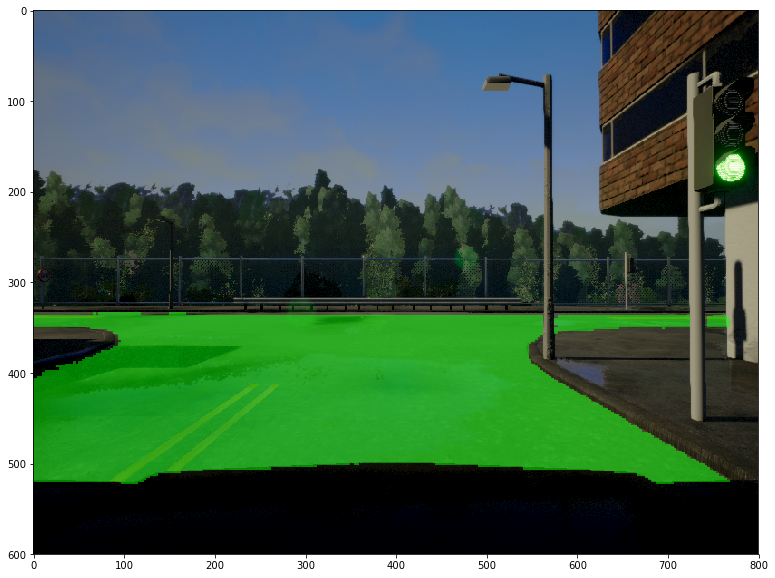

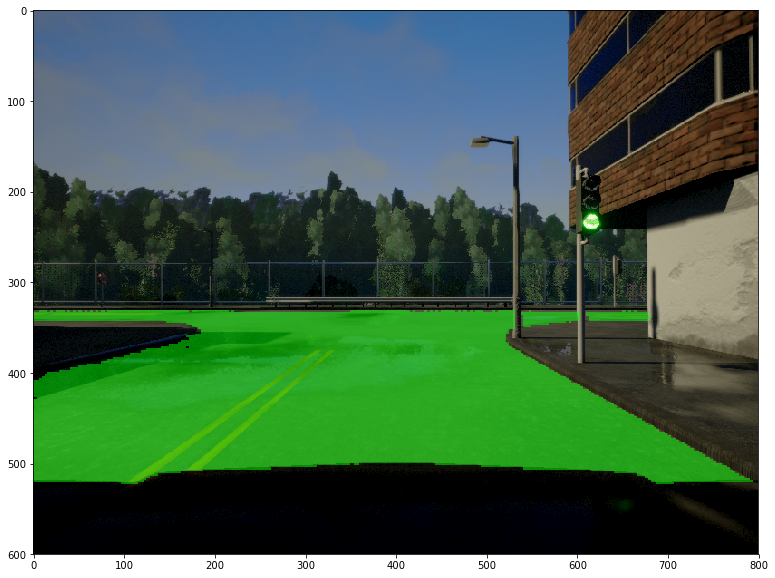

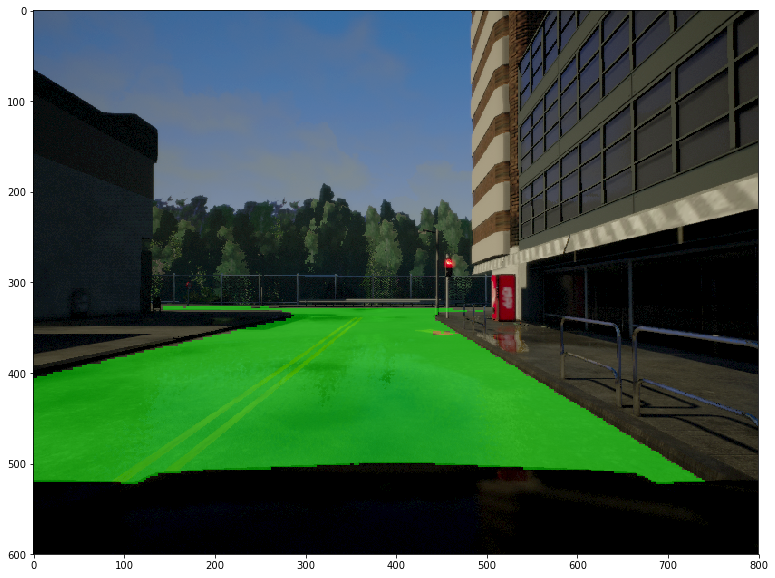

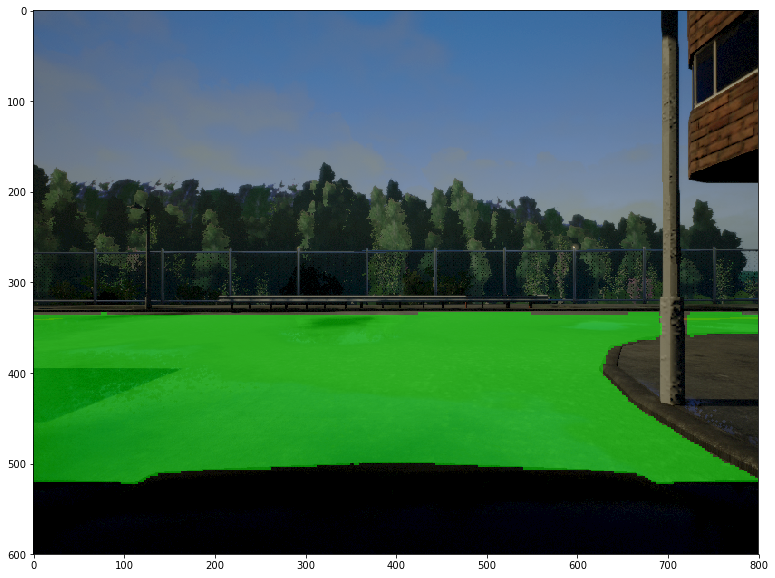

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


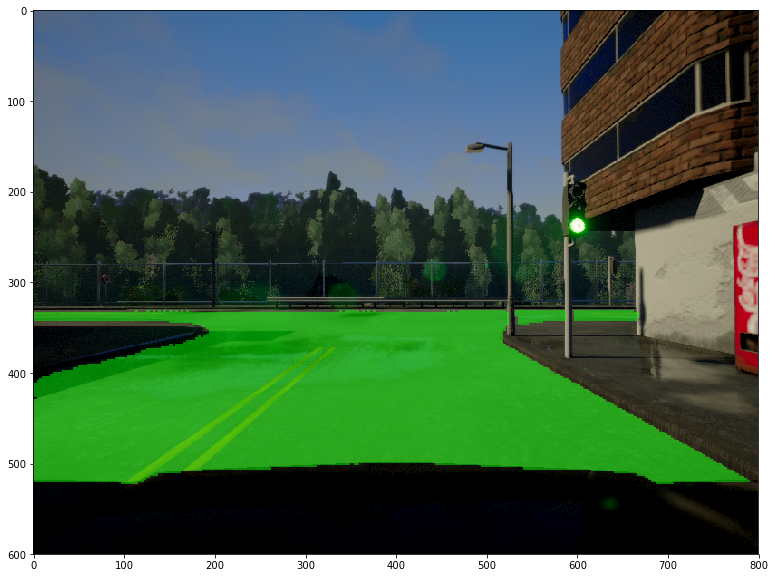

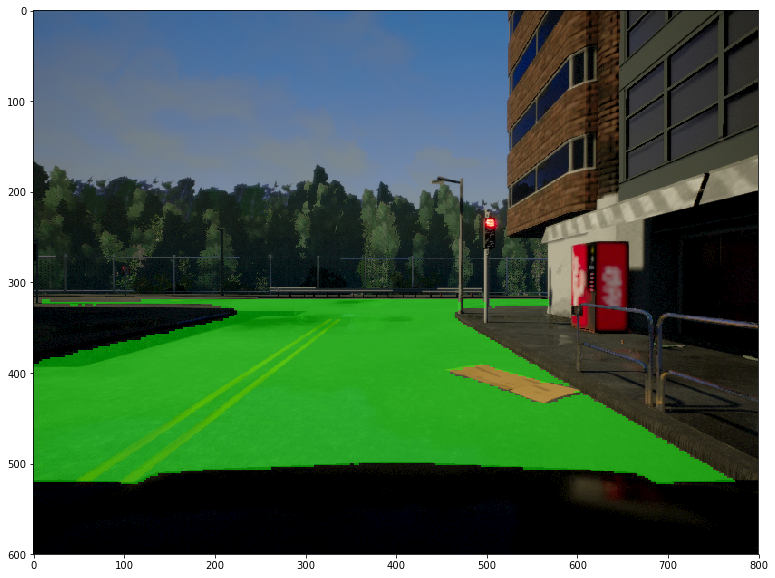

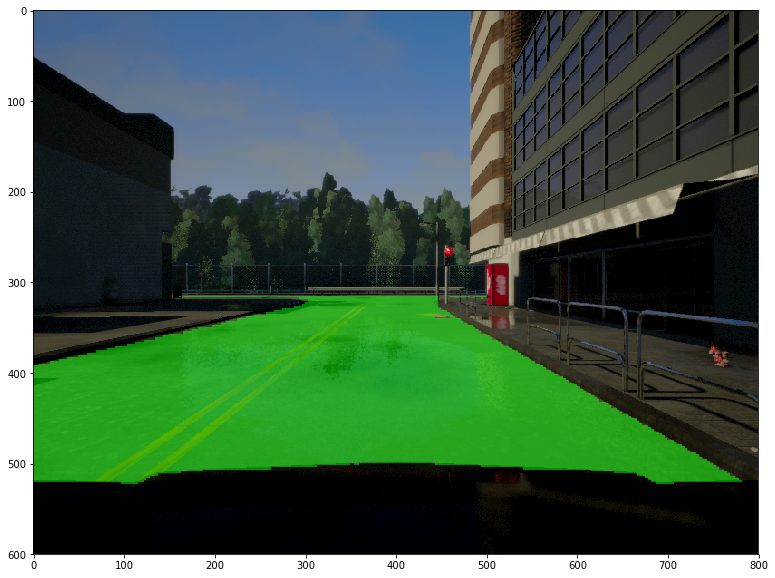

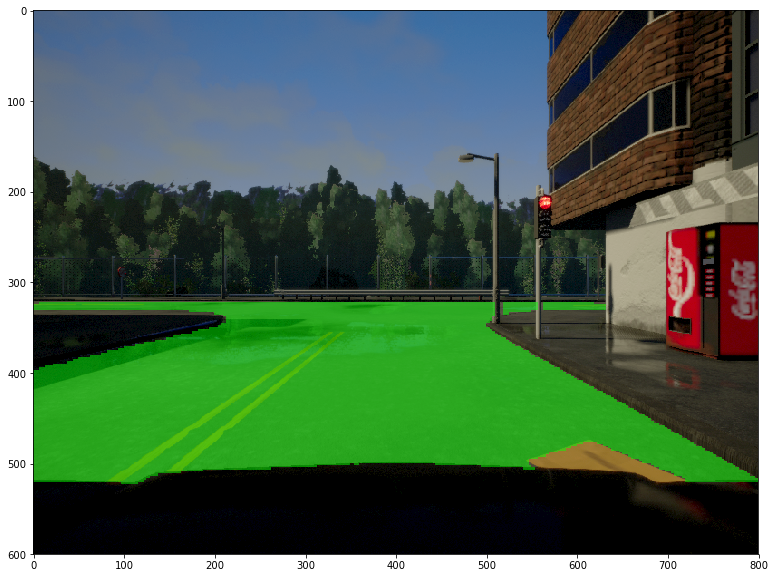

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


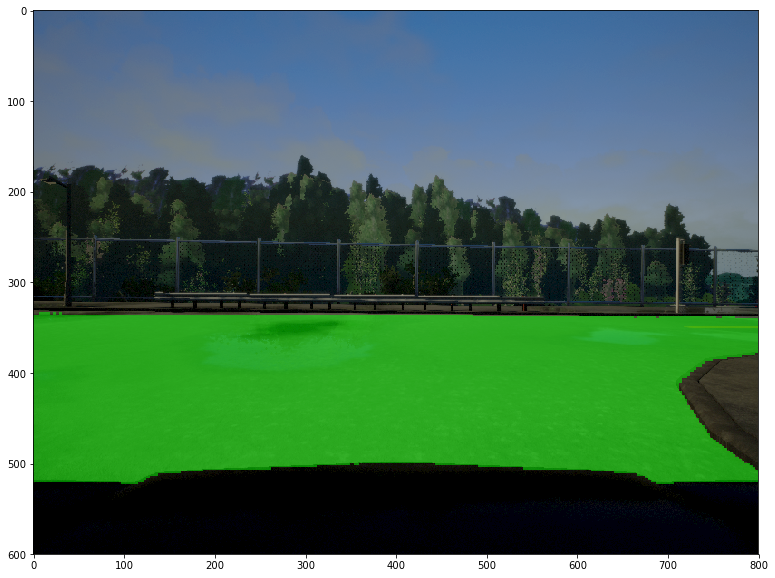

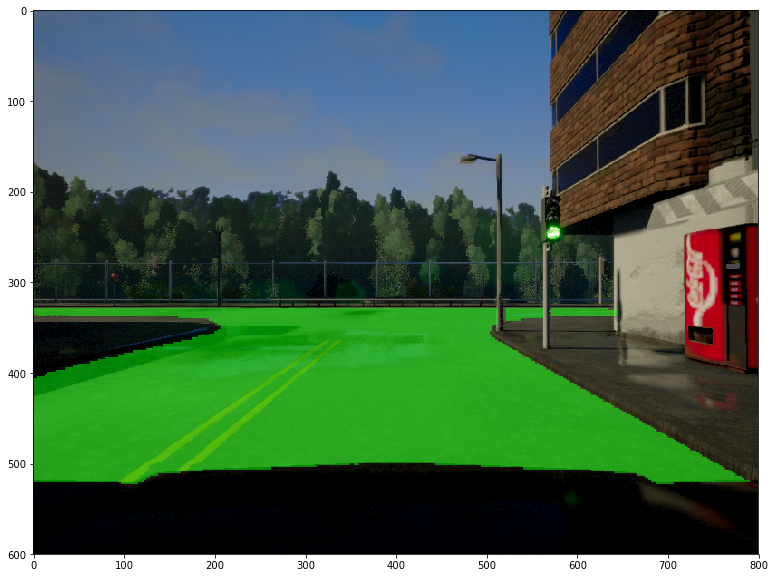

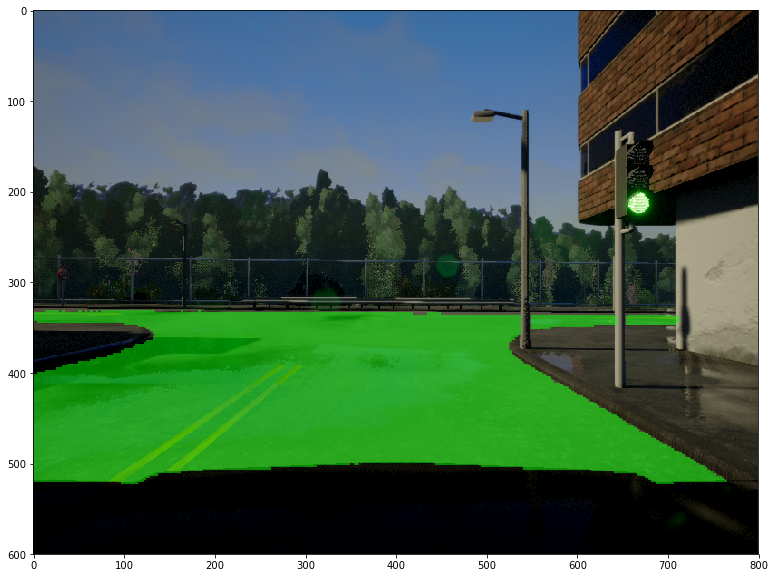

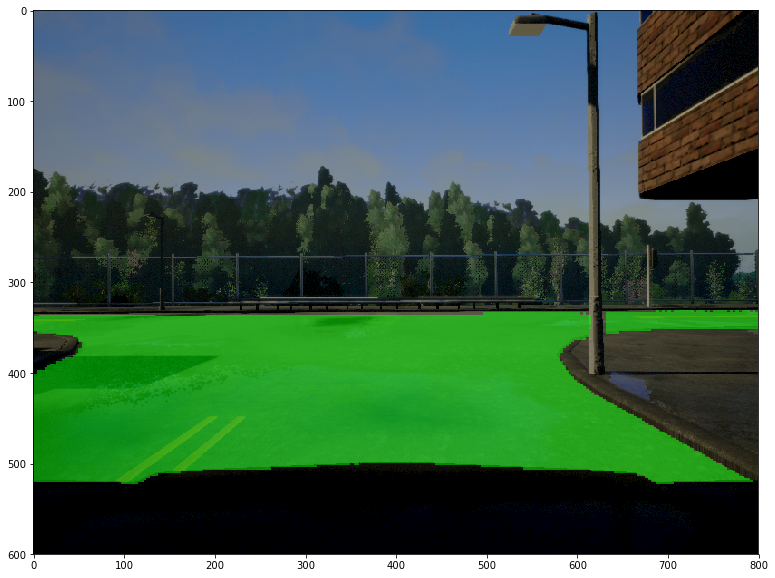

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


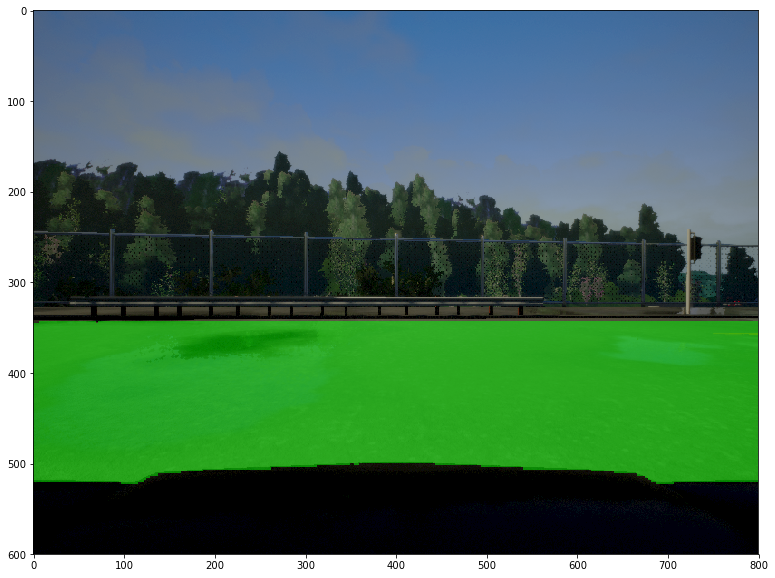

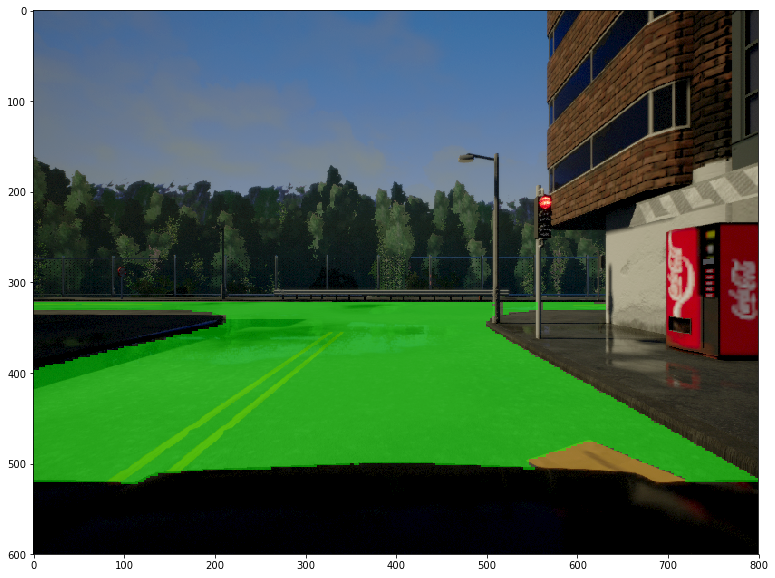

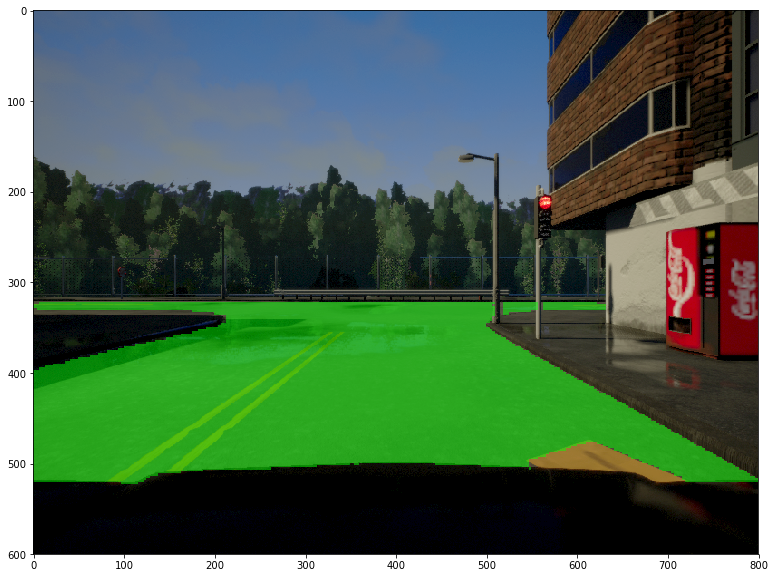

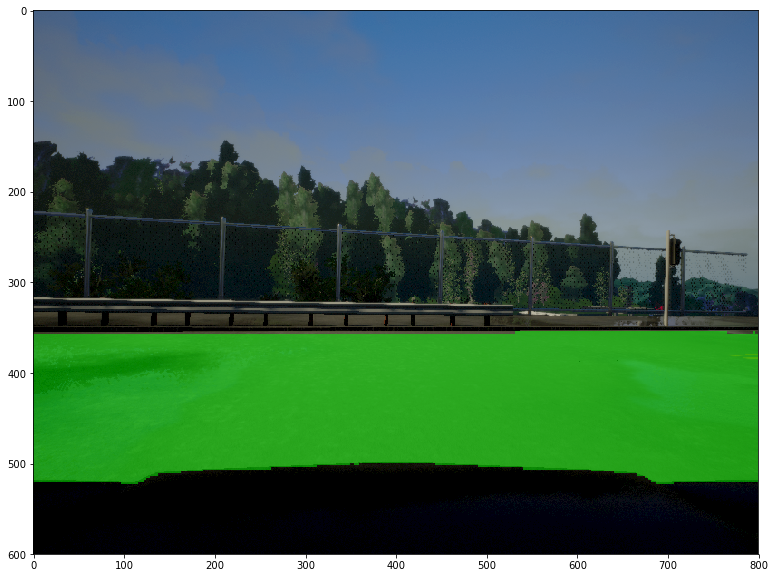

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


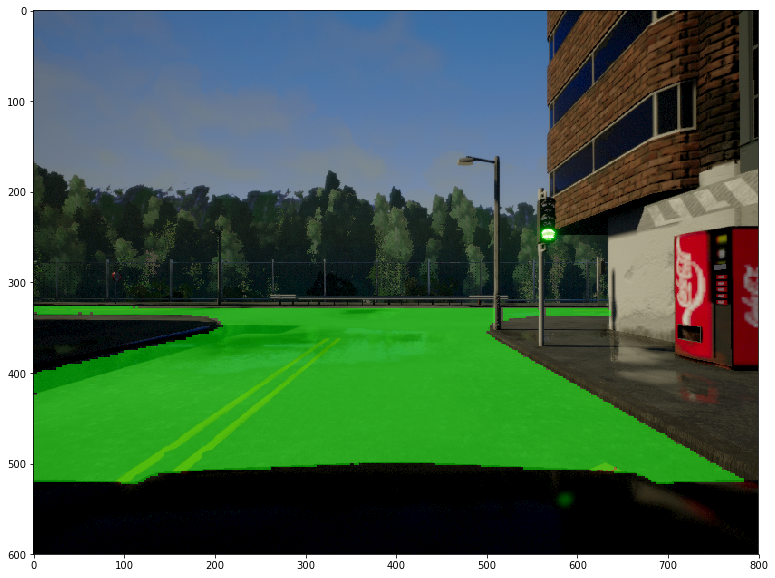

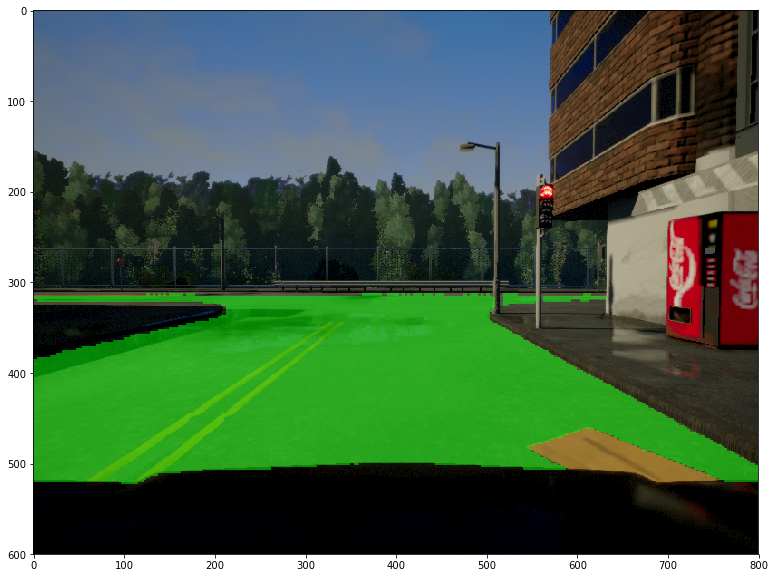

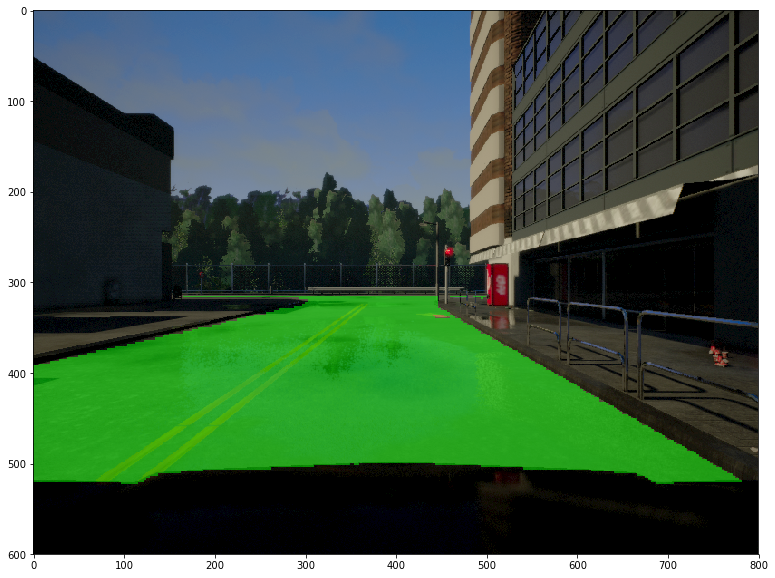

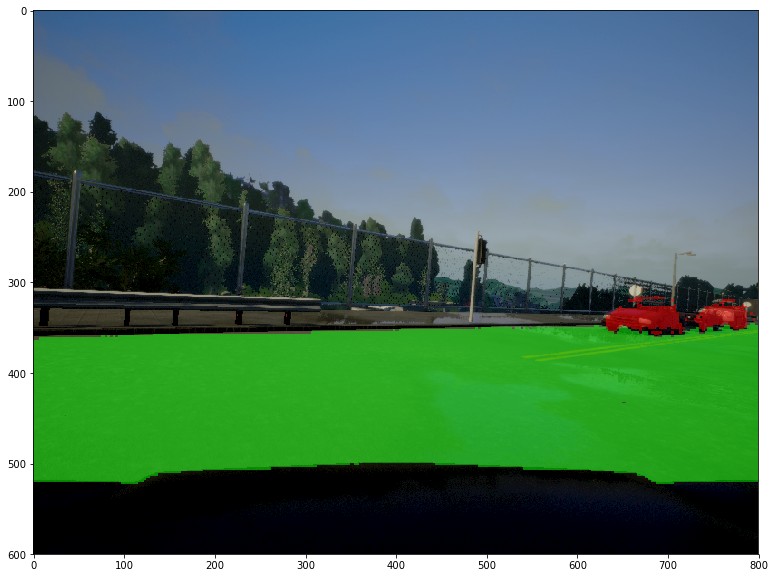

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


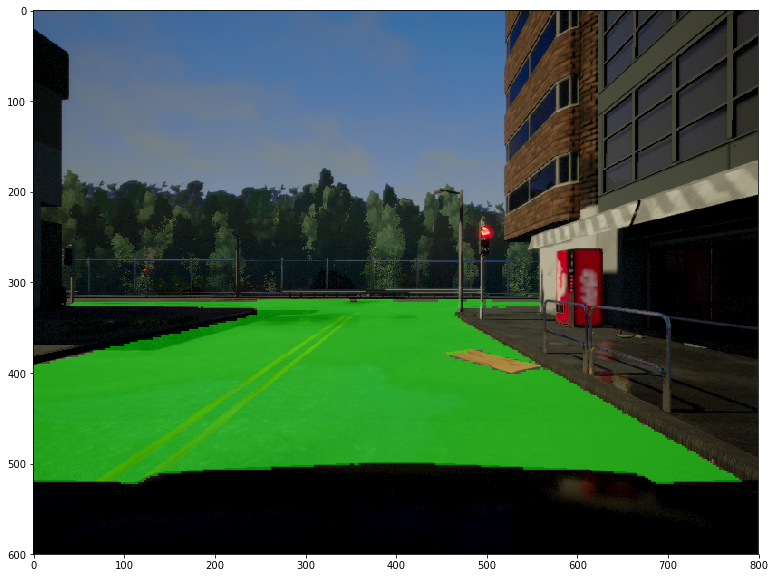

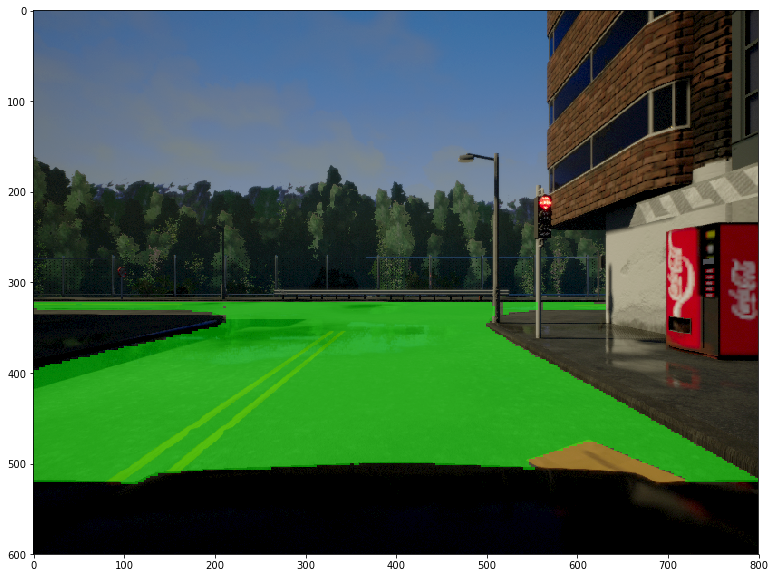

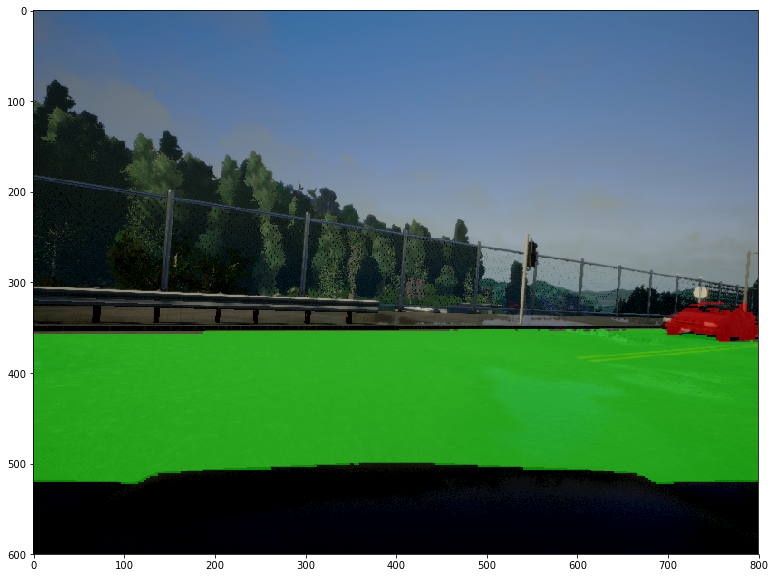

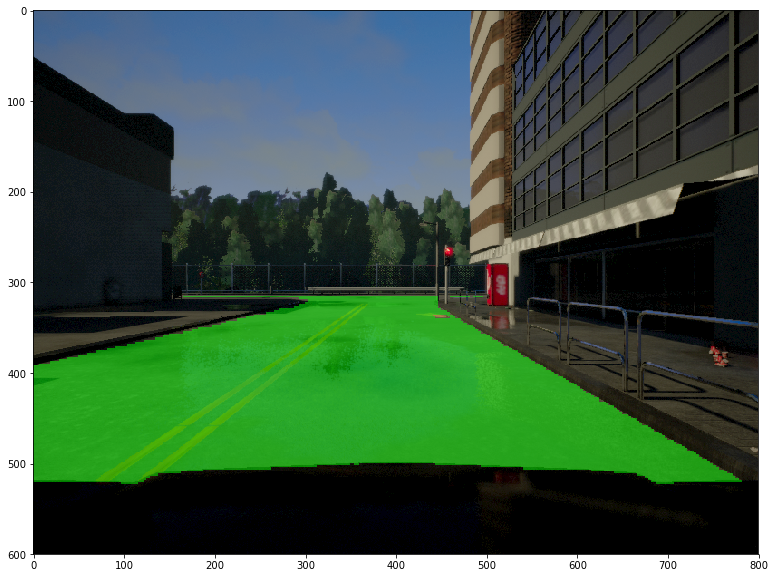

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


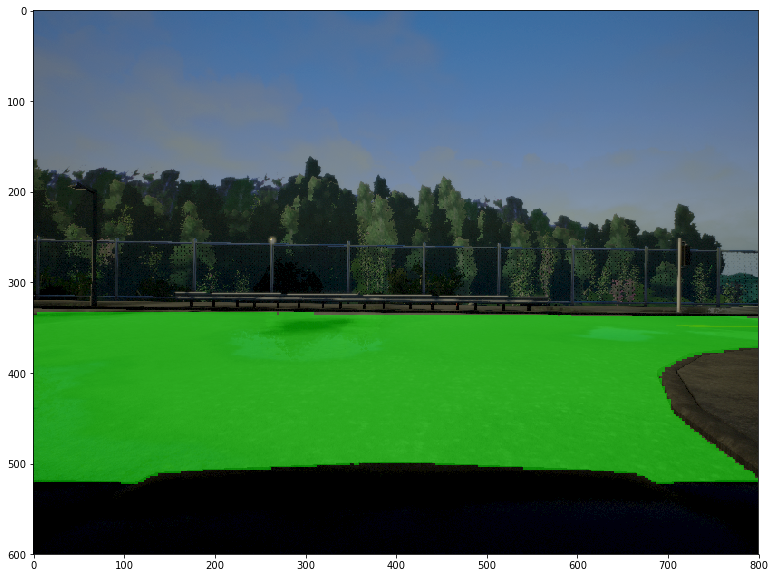

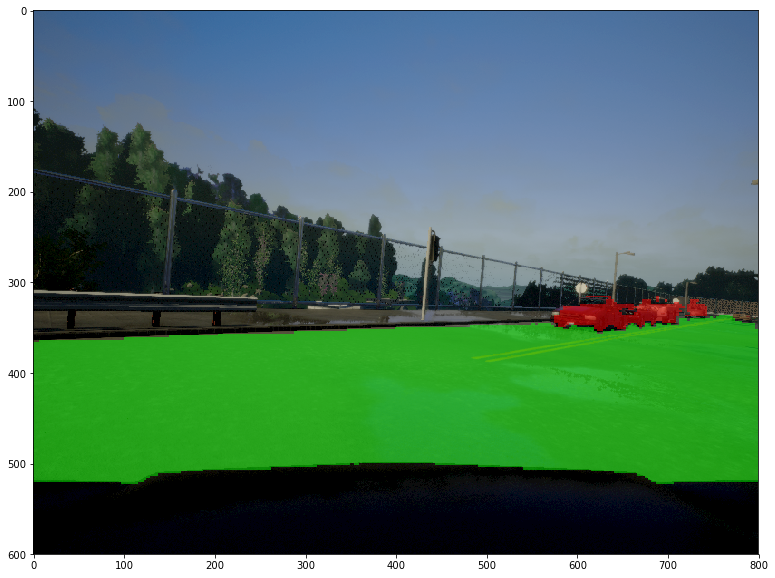

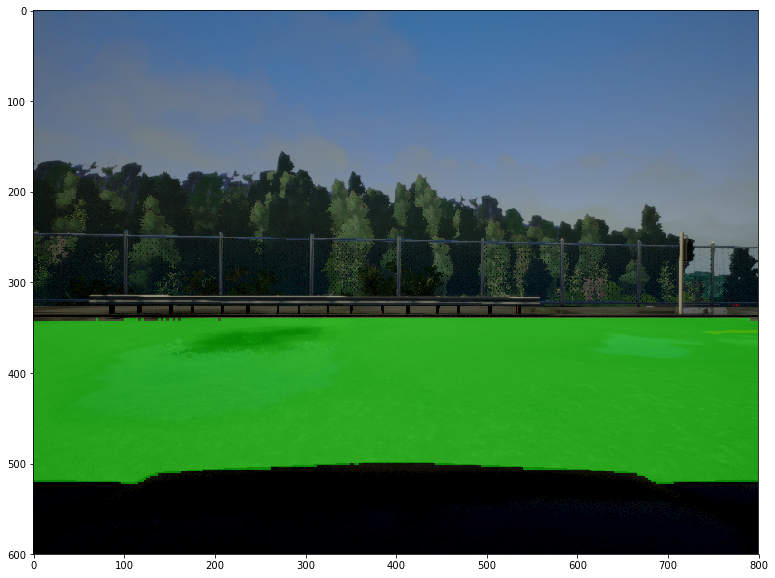

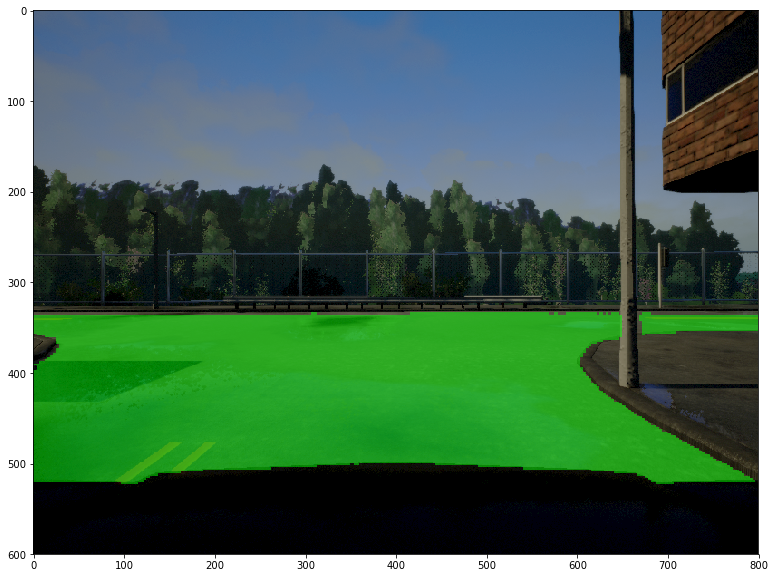

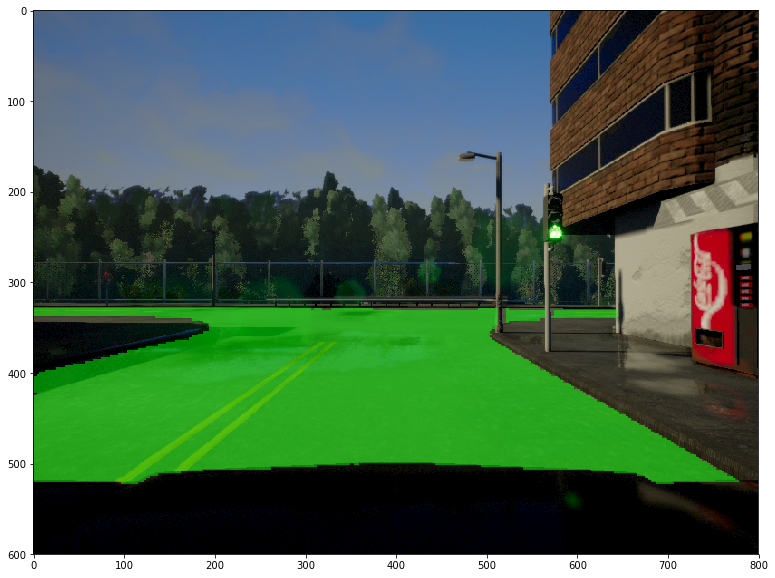

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


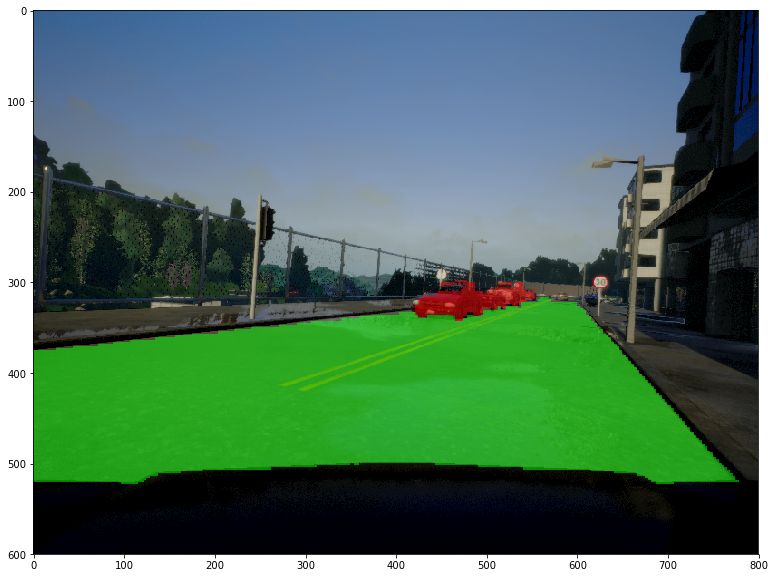

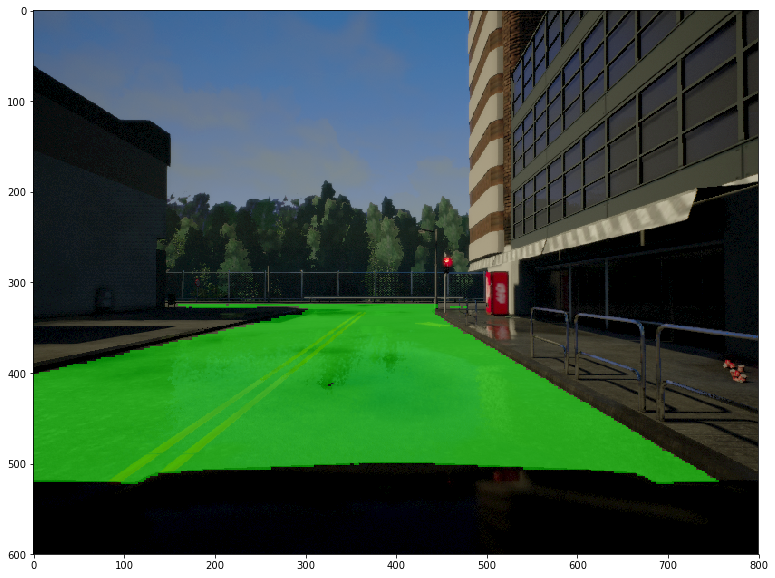

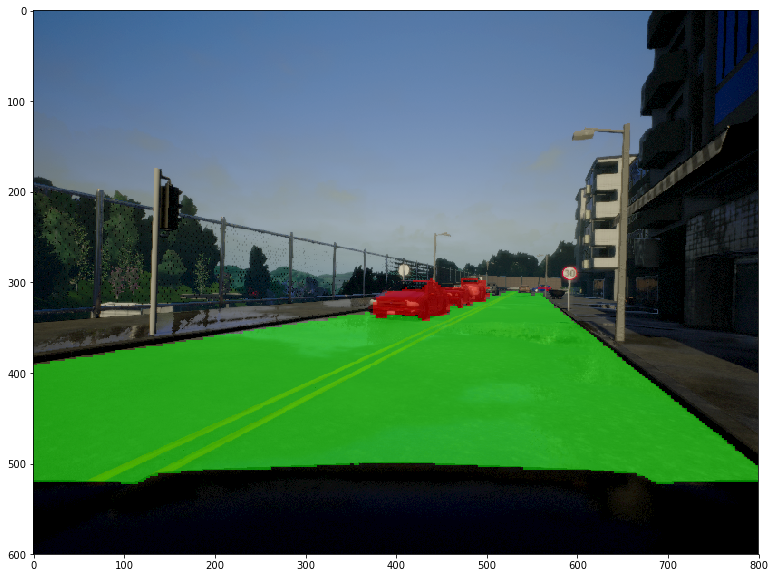

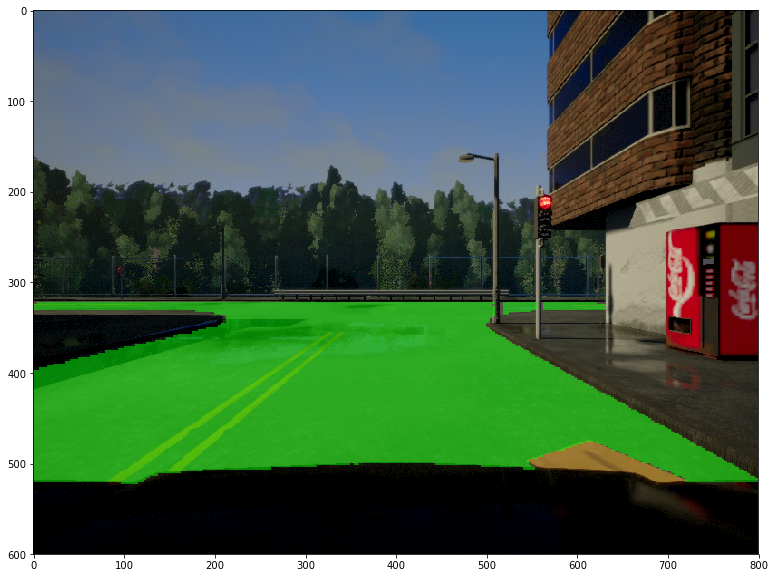

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


KeyboardInterrupt: 

In [9]:
for img in images:
    plt.figure(figsize=(15,10))
    plt.imshow(img)
    plt.show()